## Random Part Generation

In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import os
from keras.preprocessing import image
import numpy as np
from PIL import Image
import random

In [3]:
imgFile = 'new-part1/origin'
length, width = 300, 300

dataList = []
for f in os.listdir(imgFile):
    if f[0] == '.':
        continue
    temp = image.load_img(os.path.join(imgFile, f),
                          target_size = (length, width))
    d = image.img_to_array(temp)
    dataList.append(d)

In [4]:
def genPartial(fileName, partial=0.8, target_num=10):
    '''
    fileName: the file name of your picture
    partial: all the subsets should have the area that is greater than 0.8 of the origin
    target_num: how many you want
    '''
    tempImg = image.load_img(fileName, target_size = (length, width))
    tempD = image.img_to_array(tempImg)
    numGen = 0
    result = []
    while numGen < target_num:
        x = np.floor(np.random.rand(2)*length)
        x1, x2 = int(np.min(x)), int(np.max(x))
        if (x2-x1)<length*0.8:
            continue
        yband = length * width * partial / (x2-x1)
        while True:
            y = np.floor(np.random.rand(2)*width)
            y1, y2 = int(np.min(y)), int(np.max(y))
            if (y1 + yband < width) and (y1+yband < y2):
                y2 = int(min(y2, y1 + yband))
                break
        res = tempD[x1:(x2+1), y1:(y2+1)]
        res = np.expand_dims(res, axis = 0)
        res = np.vstack(res)
        result.append(res)
        numGen += 1
#         print(numGen)
    return result


In [5]:
np.random.seed(20220329)
fNames = [os.path.join(imgFile,x) for x in os.listdir(imgFile)]
test = genPartial(fNames[0], 0.6, 50)

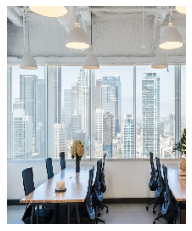

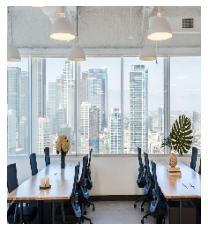

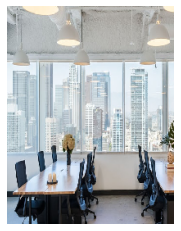

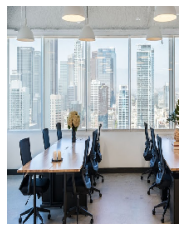

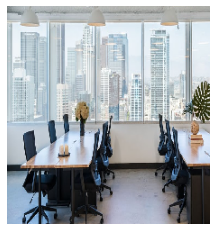

...

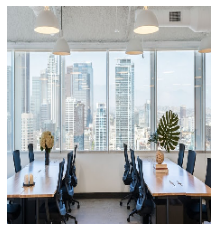

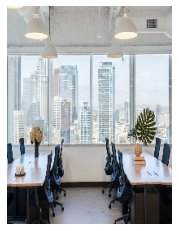

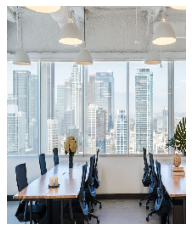

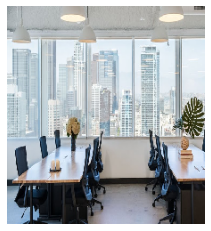

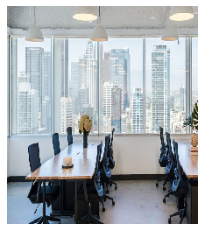

In [6]:
for t in test:
    plt.imshow(image.array_to_img(t))
    plt.axis('off')
    plt.show()

Metal device set to: Apple M1


2022-04-07 10:26:57.092269: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-04-07 10:26:57.094214: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


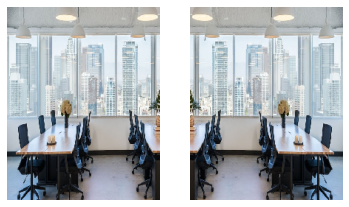

In [7]:
t1 = test[3]
t2 = tf.image.random_flip_left_right(t1)
fig, ax = plt.subplots(1,2)
ax[0].imshow(image.array_to_img(t1))
ax[0].axis('off')
ax[1].imshow(image.array_to_img(t2))
ax[1].axis('off')
plt.show()

In [8]:
toFile = 'new-part1/train'
perc = 0.6
nParts = 50
fNames = [os.path.join(imgFile,x) for x in os.listdir(imgFile)]


for i in range(len(fNames)):
    tempF = 'c' + str(i)
    if tempF not in os.listdir(toFile):
        os.mkdir(os.path.join(toFile, tempF))
    tempF = os.path.join(toFile, tempF)
    temp = fNames[i]
    parts = genPartial(temp, perc, nParts)
    for j in range(nParts):
        figName = 'f' + str(j) + '.jpg'
        image.array_to_img(parts[j]).save(os.path.join(tempF, figName))

## Model

In [2]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
import matplotlib.pyplot as plt 
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

In [14]:
trainLen, trainWid = 150, 150
TRAINDIR = 'new-part1/train'
training_datagen = ImageDataGenerator(rescale = 1/255,
                                      rotation_range = 40,
                                      width_shift_range = 0.2,
                                      height_shift_range = 0.2,
                                      shear_range = 0.2,
                                      zoom_range = 0.2,
                                      horizontal_flip = True, 
                                      fill_mode = 'nearest')

VALIDDIR = 'new-part1/valid'
validation_datagen = ImageDataGenerator(rescale = 1/255)

train_generator = training_datagen.flow_from_directory(TRAINDIR,
                                                       target_size = (trainLen, trainWid),
                                                       class_mode = 'categorical')
validation_generator = validation_datagen.flow_from_directory(VALIDDIR,
                                                              target_size = (trainLen, trainWid),
                                                              class_mode = 'categorical')





Found 160 images belonging to 4 classes.
Found 40 images belonging to 4 classes.


In [15]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu', input_shape = (trainLen, trainWid,3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(512, activation = 'relu'),
    tf.keras.layers.Dense(4, activation = 'softmax')
])
# model.summary()
model.compile(loss = 'categorical_crossentropy', optimizer = 'rmsprop',
              metrics = ['accuracy'])
history = model.fit_generator(train_generator, epochs = 20,
                              validation_data = validation_generator,
                              verbose = 1)

Epoch 1/20


/var/folders/fg/djqhc20d1mq3yj441_w_kx7m0000gn/T/ipykernel_31205/2626153355.py:18: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator, epochs = 20,
2022-04-07 12:29:44.450482: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


5/5 [==============================] - 2s 203ms/step - loss: 3.1813 - accuracy: 0.2438 - val_loss: 1.3493 - val_accuracy: 0.4250
Epoch 2/20


2022-04-07 12:29:45.859561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


5/5 [==============================] - 1s 166ms/step - loss: 1.4368 - accuracy: 0.2688 - val_loss: 1.3485 - val_accuracy: 0.5000
Epoch 3/20
5/5 [==============================] - 1s 171ms/step - loss: 2.0945 - accuracy: 0.2938 - val_loss: 1.3403 - val_accuracy: 0.2500
Epoch 4/20
5/5 [==============================] - 1s 163ms/step - loss: 1.2811 - accuracy: 0.3563 - val_loss: 1.1089 - val_accuracy: 0.6000
Epoch 5/20
5/5 [==============================] - 1s 168ms/step - loss: 2.2091 - accuracy: 0.5000 - val_loss: 1.0957 - val_accuracy: 0.4000
Epoch 6/20
5/5 [==============================] - 1s 162ms/step - loss: 1.1671 - accuracy: 0.5312 - val_loss: 1.0934 - val_accuracy: 0.4500
Epoch 7/20
5/5 [==============================] - 1s 165ms/step - loss: 0.9058 - accuracy: 0.6125 - val_loss: 0.7204 - val_accuracy: 0.6500
Epoch 8/20
5/5 [==============================] - 1s 169ms/step - loss: 1.1868 - accuracy: 0.5625 - val_loss: 0.7729 - val_accuracy: 0.8750
Epoch 9/20
5/5 [===============

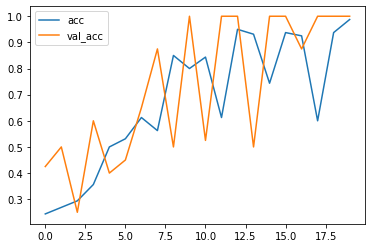

In [16]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))
plt.plot(epochs, acc, label = 'acc')
plt.plot(epochs, val_acc, label = 'val_acc')
plt.legend(loc=0)
plt.show()

# Test

[[1. 0. 0. 0.]]


2022-04-07 12:30:10.582497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


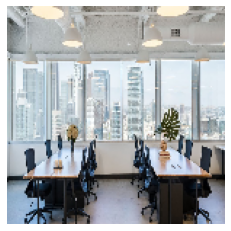

[[0. 1. 0. 0.]]


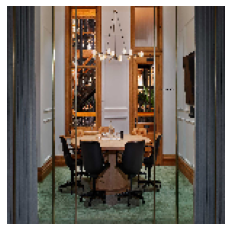

[[0. 0. 1. 0.]]


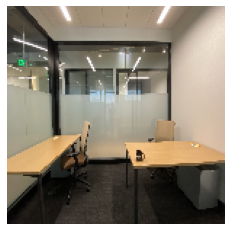

[[0. 0. 0. 1.]]


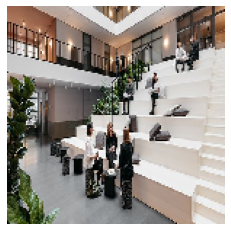

In [17]:
# your chosen 4 pics
#0-wework 1-neuehouse 2-venturex 3-officespaces
originFile = 'new-part1/origin'
files = [os.path.join(originFile,x) for x in os.listdir(originFile)]
for f in files:
    tempImg = image.load_img(f, target_size=(trainLen, trainWid))
    x = image.img_to_array(tempImg)
    x = np.expand_dims(x, axis = 0)
    images = np.vstack([x])
    print(model.predict(images, batch_size = 10))
    plt.imshow(tempImg)
    plt.axis('off')
    plt.show()

wework_54_4.jpg


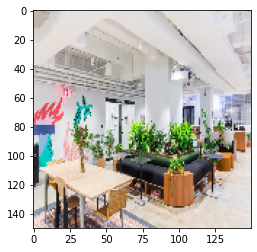

array([[0., 0., 1., 0.]], dtype=float32)

In [21]:
testFile = 'new-part1/test'
no = 3
vFiles = os.listdir(testFile)
testpic = os.path.join(testFile, vFiles[no])
img = image.load_img(testpic, target_size = (trainLen, trainWid))
print(vFiles[no])
plt.imshow(img)
plt.show()
x = image.img_to_array(img)
x = np.expand_dims(x, axis = 0)
images = np.vstack([x])
classes = model.predict(images, batch_size = 10)
classes

In [8]:
vFiles

['.DS_Store',
 'venturex2.jpg',
 'wework_53_0.jpg',
 'wework_54_4.jpg',
 'venturex.jpg']

## Test

In [38]:
import pandas as pd

In [71]:
def load_data(path,datasize_perlable=None,is_sorted=False,islabeled=0,size=(224,224)):
    print('[INFO] loading images...')
    data = []
    labels = []
    
    root, dirs, files = list(os.walk(path))[0]
    
    if islabeled==1:
        files_ = []
        for d in dirs:
            l = os.listdir(path+'/'+d)
            if is_sorted:
                l.sort()
            for f in l[:datasize_perlable]:
                img = image.load_img(path+'/'+d+'/'+f,target_size=size,) # interpolation='lanczos' -- better quality but worse performance(speed)
                img = image.img_to_array(img)
                data.append(img)
                
                labels.append(d)
                files_.append(path+'/'+d+'/'+f)
    else:
        files_ = []
        if is_sorted:
            files.sort()
        for f in files[:datasize_perlable]:
            img = image.load_img(path=path+'/'+f,target_size=size,)
            img = image.img_to_array(img)
            data.append(img)
            
            files_.append(path+'/'+f)
    
    return np.array(data),np.array(labels).astype(int),files_

trainFile = '/Users/yiyuan/Desktop/AIP/sample image data/wework_imageType/indoors'
trainList = []
data,labels,files_ = load_data(trainFile,datasize_perlable=100,is_sorted=True,islabeled=0,size=(150,150))


[INFO] loading images...


In [72]:
emb = tf.keras.models.Model(inputs=model.input,outputs=model.layers[-2].output)
embeddings = pd.DataFrame(emb.predict(data, batch_size = 10))
embeddings.head()

2022-04-07 12:55:31.309673: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,0.0,81.608643,0.0,0.000000,0.0,39.671448,0.0,40.221397,29.796621,92.373871,...,0.0,0.0,73.723129,65.927559,163.234131,388.376404,106.584183,0.000000,0.00000,0.000000
1,0.0,258.935394,0.0,119.239601,0.0,0.000000,0.0,0.000000,0.000000,238.862366,...,0.0,0.0,113.128349,1.270409,20.455017,499.361969,47.054916,0.000000,0.00000,0.000000
2,0.0,150.145676,0.0,180.089508,0.0,0.000000,0.0,0.000000,0.000000,194.284378,...,0.0,0.0,54.571995,19.604675,15.812489,441.902985,4.769905,0.000000,0.00000,0.000000
3,0.0,0.000000,0.0,45.406349,0.0,88.955666,0.0,115.613182,0.000000,20.170282,...,0.0,0.0,0.000000,0.000000,215.863556,220.996475,32.069878,78.559555,54.68647,57.726009
4,0.0,224.791031,0.0,252.706375,0.0,0.000000,0.0,0.000000,0.000000,224.849915,...,0.0,0.0,47.913307,30.658504,13.706640,493.287750,1.015684,0.000000,0.00000,0.000000


In [74]:
embeddings['most_similar'] = embeddings.apply(lambda x:
                                              files_[(((embeddings.drop(x.name)-x)**2).sum(axis=1)**0.5).idxmin()].split('/')[-1]
                                              ,axis=1)

In [75]:
embeddings['name'] = pd.Series(files_).apply(lambda x:x.split('/')[-1])


In [77]:
embeddings[['name','most_similar']]

,name,most_similar
0,wework_0_1.jpg,wework_103_0.jpg
1,wework_0_2.jpg,wework_101_3.jpg
2,wework_0_3.jpg,wework_104_4.jpg
3,wework_0_4.jpg,wework_106_3.jpg
4,wework_0_5.jpg,wework_0_3.jpg
...,...,...
95,wework_110_2.jpg,wework_10_3.jpg
96,wework_110_3.jpg,wework_103_1.jpg
97,wework_110_4.jpg,wework_105_6.jpg
98,wework_110_5.jpg,wework_109_2.jpg


In [103]:
embeddings['label'] = pd.Series(model.predict(data, batch_size = 10).argmax(axis=1))

In [105]:
#0-wework 1-neuehouse 2-venturex 3-officespaces
originFile = 'new-part1/origin'
origin_files = [os.path.join(originFile,x) for x in os.listdir(originFile)]
origin_office = ['wework', 'neuehouse', 'venturex', 'officespaces']

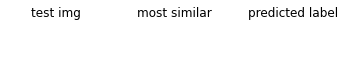

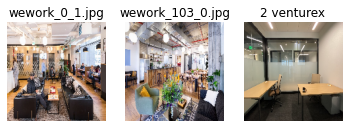

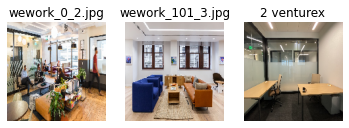

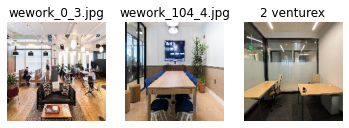

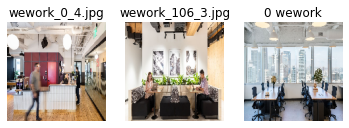

...

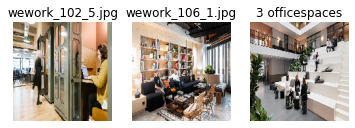

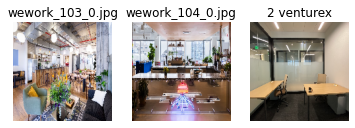

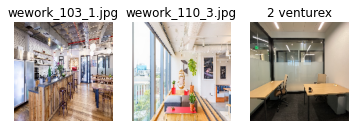

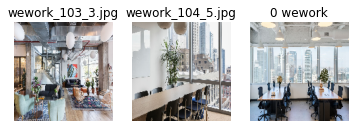

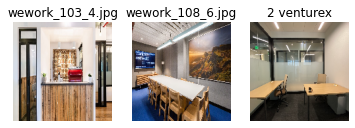

In [130]:
plt.figure(figsize=(6,1))
plt.subplot(1,3,1)
plt.title('test img')
plt.axis('off')
plt.subplot(1,3,2)
plt.title('most similar')
plt.axis('off')
plt.subplot(1,3,3)
plt.title('predicted label')
plt.axis('off')
plt.show()

for i,(name,most_similar,label) in embeddings[['name','most_similar','label']][:30].iterrows():
    plt.figure()
    
    tempImg1 = image.load_img(trainFile+f'/{name}', target_size=(trainLen, trainWid))
    plt.subplot(1,3,1)
    plt.imshow(tempImg1)
    plt.axis('off')
    plt.title(name)
    
    tempImg2 = image.load_img(trainFile+f'/{most_similar}', target_size=(trainLen, trainWid))
    plt.subplot(1,3,2)
    plt.imshow(tempImg2)
    plt.axis('off')
    plt.title(most_similar)
    
    tempImg3 = image.load_img(origin_files[label], target_size=(trainLen, trainWid))
    plt.subplot(1,3,3)
    plt.imshow(tempImg3)
    plt.axis('off')
    plt.title(f'{label} {origin_office[label]}')
    
    plt.show()


In [87]:
labels = pd.DataFrame(model.predict(data, batch_size = 10))
labels.head(10)

,0,1,2,3
0,0.0,0.000000e+00,1.0,0.0
1,0.0,0.000000e+00,1.0,0.0
2,0.0,0.000000e+00,1.0,0.0
3,1.0,0.000000e+00,0.0,0.0
4,0.0,0.000000e+00,1.0,0.0
5,0.0,0.000000e+00,1.0,0.0
6,0.0,0.000000e+00,1.0,0.0
7,0.0,0.000000e+00,1.0,0.0
8,1.0,1.209739e-15,0.0,0.0
9,1.0,0.000000e+00,0.0,0.0


In [98]:
# labels[(labels.iloc[:,:-2]>0).all(axis=1)]
labels.describe()


,0,1,2,3
0,1.000000,-0.114228,-0.694489,-0.348966
1,-0.114228,1.000000,-0.124079,-0.062349
2,-0.694489,-0.124079,1.000000,-0.379070
3,-0.348966,-0.062349,-0.379070,1.000000


In [88]:
labels['most_similar'] = labels.apply(lambda x:
                                              files_[(((embeddings.drop(x.name)-x)**2).sum(axis=1)**0.5).idxmin()].split('/')[-1]
                                              ,axis=1)

In [89]:
labels['name'] = pd.Series(files_).apply(lambda x:x.split('/')[-1])


In [90]:
labels[['name','most_similar']]

,name,most_similar
0,wework_0_1.jpg,wework_102_0.jpg
1,wework_0_2.jpg,wework_102_0.jpg
2,wework_0_3.jpg,wework_102_0.jpg
3,wework_0_4.jpg,wework_102_0.jpg
4,wework_0_5.jpg,wework_102_0.jpg
...,...,...
95,wework_110_2.jpg,wework_102_0.jpg
96,wework_110_3.jpg,wework_102_0.jpg
97,wework_110_4.jpg,wework_102_0.jpg
98,wework_110_5.jpg,wework_102_0.jpg


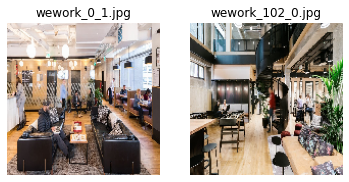

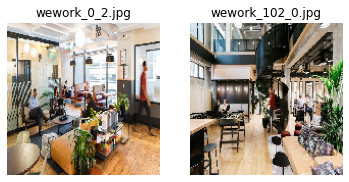

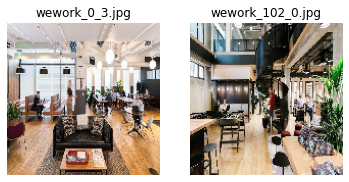

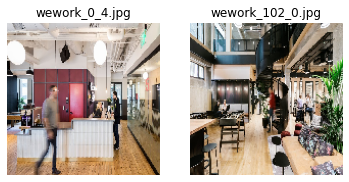

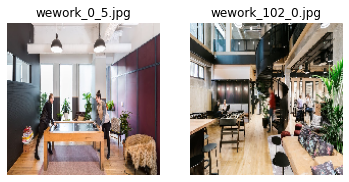

...

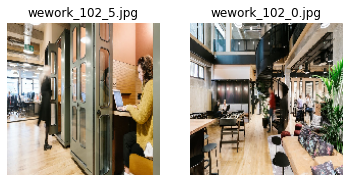

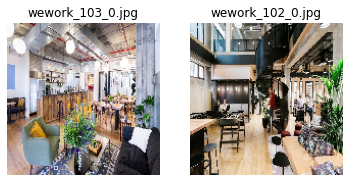

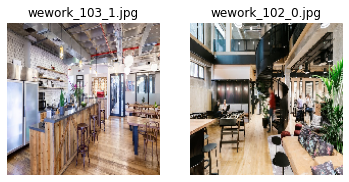

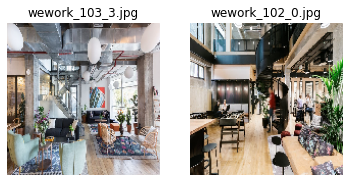

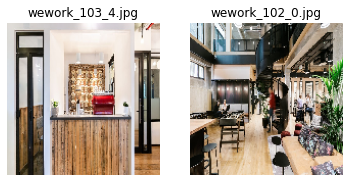

In [91]:
for i,(name,most_similar) in labels[['name','most_similar']][:30].iterrows():
    tempImg1 = image.load_img(trainFile+f'/{name}', target_size=(trainLen, trainWid))
    plt.subplot(1,2,1)
    plt.imshow(tempImg1)
    plt.axis('off')
    plt.title(name)
    tempImg2 = image.load_img(trainFile+f'/{most_similar}', target_size=(trainLen, trainWid))
    plt.subplot(1,2,2)
    plt.imshow(tempImg2)
    plt.axis('off')
    plt.title(most_similar)
    plt.show()
